<a href="https://colab.research.google.com/github/GMISSAGLIA/GM_PyLab/blob/Main/TD_BANKIT_REGRESSION_YoY_V4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Walking around the IFRS9  Forward Looking Expected Credit Loss

Il principio contabile FRS 9 richiede alle istituzioni finanziarie di adeguare la metodologia adotta ai fini del calcolo delle svalutaioni dei crediti passando da un approccio retrospettivo basato sulle evidenze delle perdite incorse - "incurred loss approach", ad uno prospettico - Forword Loocking Approach.  Da tale disposizione discende ancora una volta la necessità di una una stretta comunicazione tra Bilancio e Risk Management in  modo tale da garantire la coerenza tra i modelli di rischio e le  svalutazioni dei crediti così come rappresentate in bilancio.

In particolare ai fini del calcolo della -ECL- Expected Credit Loss si rende necessario determinare in qualche modo l'influenza dei fattori sistemici o macroeconomici in modo tale da poterne misurare l'effetto nei diversi scenari.
In tale contesto devono pertanto essere affrontate due questioni principali relative a come:

 1) elaborare e definire prospetticamente degli scenari significativi e realistici riguardo l'evoluzione futura dei fattori che caratterizzano il quadro sistemico e quindi i valori dei parametri di rischio;
 
 2) modellizzare la relazione di dipendenza rispetto al quadro sistemico  e quindi stimare le  sensitivities  rispetto ai sopracitati fattori.
 
 
in relazione al secondo punto si riportano di seguito i risultati di alcune prove di analisi effettuate al fine di stimare un modello di regressione lineare tra il Credit Worhiness Y implicito nei tassi di decadimento trimestrali Bankit -TD- e un set di fattori macroeconomici quali il PIL, il tasso di disoccupazione, i tassi d'interesse bancari, il commercio estero, indici immobiliari, offerta di moneta M3, credito concesso ad imprese non finanziarie e famiglie consumatrici, tassi d'interesse, inflazione ...

Come modello di riferimento si è preso il [Credit Portfolio View](https://wolfccb.com/wp-content/uploads/2019/02/Wilson-T.-C.-1997.-Portfolio-Credit-Risk-Part-I-Risk-Magazine-Vol-10-No.-9.pdf)  di Thomas  Wilson che definisce la relazione di dipendenza esistente tra probabilità di default e fattori macroeconomici attraverso una funzione logistica.
Il Credit Worthiness - CW -  è stato estratto dai Tassi Decadimento trimestrali -TD - sulla base della relazione:

   1) TD = 1/(1+EXP(-CW)) - Tasso di Decadimento -
   
   2) CW = -log[(1-TD)/TD] - Credit Worthiness -
   
Le evidenze sembrano mostrare la presenza di una relazione significativa  tra il Credit Worthiness -CW - estratto dai Tassi di Decadimento e il [Credit To GDP Gap](https://www.bis.org/statistics/c_gaps.htm); quest'ultimo indicatore è anche la grandezza di riferimento in base alla quale il [Comitato di Basilea](https://www.bis.org/publ/qtrpdf/r_qt1403g.htm#:~:text=The%20credit%2Dto%2DGDP%20gap%20(%22credit%20gap%22,(EWI)%20for%20banking%20crises) prevede che sia determinato (con gli adattamenti previsti dalle singole autorità nazionali) il requisto patrimoniale relativo alla riserva di capitale anticiclica.

I tassi di decadimento sono reperibili sul sito della Banca d'Italia 
[Tassi di decadimento trimestrali dei Residenti al netto delle Istituzioni Finanziarie - Numeri -](https://infostat.bancaditalia.it/inquiry/home?spyglass/taxo:CUBESET=/PUBBL_00/PUBBL_00_06/PUBBL_00_06_06&ITEMSELEZ=TRI30486:true&OPEN=false/&ep:LC=IT&COMM=BANKITALIA&ENV=LIVE&CTX=DIFF&IDX=2&/view:CUBEIDS=TRI30486)


In [1]:
#se si vuole eseguire in Google Colab occorre
#impostare la variabile colab a True - colab = True per installare le due librerie
colab = True
if colab:
    !pip install XlsxWriter
    !pip install pandasql 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 149 kB 4.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26784 sha256=bdece4c207da7d0e30745ad9399b8fd34ece3aa2bdf2544110f7e5dcb130c97a
  Stored in directory: /root/.cache/pip/wheels/5c/4b/ec/41f4e116c8053c3654e2c2a47c62b4fca34cc67ef7b55deb7f
Successfully built pandasql


In [2]:
#Importazione delle librerie necessarie 
# se non già presenti devono essere installate tramite !pip o conda
%matplotlib inline
import math
import numpy as np
import pandas as pd
import pandasql as pdsql
from pandasql import sqldf

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import datetime
import seaborn as sb

from sklearn.preprocessing import StandardScaler # for standardizing the Data
#from sklearn.decomposition import PCA # for PCA calculation
#from sklearn.decomposition import FactorAnalysis
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import openpyxl
import os
#import glob
#we set some print and visualization options
np.set_printoptions(precision=2)
pd.options.display.max_columns = None #to show all the columns
pd.set_option('display.float_format', lambda x: '%.3f' % x)


# Utility Functions

In [3]:
class CLS_Util(object):
 
    #we wrapp statsmodels adfullur just to get a nice result object
    @staticmethod
    def GM_ADF(series):
      from statsmodels.tsa.stattools import adfuller
      result = adfuller(series, autolag='AIC')
      out={'ADF Statistic':result[0],
          'P-values':result[1],
          'Lags':result[2], 'Critical Values':result[4]}
      return out 

    #we iterate through all the variable in the input Data Frame
    @staticmethod
    def GM_ADF_ALL( df, filter = -1, export_file='' ):
      DictADF = dict()
      for ColName in df.columns:
        series = df[[str(ColName)]]
        DictADF[ColName]= CLS_Util.GM_ADF(series)
        OUT = pd.DataFrame(DictADF).T 

      if (filter != -1) :
          OUT = OUT[OUT['P-values']>filter]
      OUT=OUT.sort_values(by=['P-values'], ascending=False)    

      if export_file !='' :  
          OUT.to_excel(export_file)
      return OUT   

    @staticmethod
    def do_lag(df,N = 12 ):#we get a matrix with the original variable and the corresponding 8 lag 
      # df = input DataFrame to transform
      # N = number_of_lag
      # str(i) we put in each variable indicate the lag order
      Dates = df.index.values
      df_with_lag = df
      for i in np.arange(1,N +1):
        df_lag = pd.DataFrame(df.values[:-i,:], index = Dates[i:], columns = ["{}_".format(x) +str(i) for x in df.columns])
        df_with_lag = pd.concat([df_with_lag, df_lag], axis=1, join="inner")
      return df_with_lag  


    @staticmethod
    def do_delta_perc(df,i = 12 ):#we get a matrix with the original variable and the corresponding 8 lag 
      # df = input DataFrame to transform
      # N = number_of_lag
      # str(i) we put in each variable indicate the lag order
      Dates = df.index.values
      df_perc = pd.DataFrame((df.values[i:,:]-df.values[:-i,:])/df.values[:-i,:], index = Dates[i:], 
                             columns = ["Perc_{}_".format(x) + str(i) for x in df.columns])
      #df_with_lag = pd.concat([df_with_lag, df_lag], axis=1, join="inner")
      return df_perc   

    @staticmethod
    def TransformData(dt_in, TransformType= 0, normalize = 0):
      dt_out = np.empty_like(dt_in)
      
      if TransformType == 1:
        dt_out = dt_in.diff()
      elif TransformType == 2:  
        dt_out = dt_in.pct_change()
      else:
        dt_out =  dt_in
      if normalize == 1:
        return (dt_out-dt_out.mean())/dt_out.std()
      else: 
        return dt_out   
      #sc = StandardScaler() 
      #std_data = sc.fit_transform(data) #Numpy ndarray  
    
    @staticmethod
    def is_locked(filepath):
       import os
       locked = None
       file_object = None
       if os.path.exists(filepath):
        try:
         buffer_size = 8
         file_object = open(filepath, 'a', buffer_size)
         if file_object:
          locked = False
        except IOError as message:
         locked = True
        finally:
         if file_object:
          file_object.close()
        return locked
   
    @staticmethod
    def wait_for_file(filepath):
       wait_time = 1
       while CLS_Util.is_locked(filepath):
         time.sleep(wait_time)
    
    @staticmethod    
    def ALL_CHARTS(df, yvar ='CW'):
     for c in df.columns:
      if c not in ['CW', 'TD']:
        FileName = "{}.png".format(c)
        #FileName = "image.png"
        df[[yvar, c]].plot()
        plt.savefig(FileName , dpi = 120)
        plt.cla
     return
    
    @staticmethod
    def ALL_CHARTS_2(df, excelfile):
        wb = openpyxl.Workbook()
        wb.save(excelfile)
        wb = openpyxl.load_workbook(excelfile)
        ws = wb.active
        n=  1
        for c in df.columns:
          if c not in ['CW', 'TD']:
            FileName = "{}.png".format(c)
            img = openpyxl.drawing.image.Image(FileName)
            if n == 1 :
              ws.add_image(img,'A{}'.format(n) )
            else:
              ws.add_image(img,'A{}'.format((n-1)*25) )
            n += 1
        wb.save(excelfile)
    
    @staticmethod
    def Delete_Charts():
      import os
      import glob
      files = glob.glob('*.png')
      for f in files:
          os.remove(f)
        
    @staticmethod
    def ALL_CHARTS_TOT(df, excelfile):
      CLS_Util.ALL_CHARTS(df)
      CLS_Util.ALL_CHARTS_2(df, excelfile)      
    

In [4]:
def Unireg_all(df, label):
  DictResults={}
  for var in df.columns :
   if var[:2] not in ['CW','TD']:
     YVAR = df.loc[:,['CW']]
     XVAR = df.loc[:,[var]]
     XVAR['CONST']= 1
     model = sm.OLS(YVAR, XVAR)
     results = model.fit()
     item = {'Data':label, 'Variable':var,'R':results.rsquared, 'PVAL':results.pvalues[0], 'PARAMS':results.params[0]}
     DictResults[var]=item

  uniregResults =pd.DataFrame(DictResults).T
  uniregResults = uniregResults.sort_values(by=['R'], ascending=False)
  uniregResults.to_excel('UNIREG_'+ label+'.xlsx')
  return uniregResults   

# Data Import

In [5]:
#Importo i tassi di decadimento
path = r'https://github.com/GMISSAGLIA/GM_PyLab/blob/Main/TD_Bankit_regression_input_data_all.xlsx?raw=true'

DF_CW = pd.read_excel(path, 'DF_CW', index_col=[0], parse_dates=[0])
DF_CW['TD']=DF_CW['TD']/100
DF_CW['CW']=-np.log((1-DF_CW['TD'])/DF_CW['TD'])

DF_CW_ALL= DF_CW.copy()
DF_CW_ALL['TD_1Y'] = (1- (1-DF_CW_ALL['TD']).rolling(4).apply(np.prod, raw = True))
DF_CW_ALL['CW_1Y']=-np.log((1-DF_CW_ALL['TD_1Y'])/DF_CW_ALL['TD_1Y'])
DF_CW_ALL = DF_CW_ALL.iloc[3:,:]

DF_CW_1Y = (1- (1-DF_CW).rolling(4).apply(np.prod, raw = True)).iloc[3:,:]
DF_CW_1Y['CW']=-np.log((1-DF_CW_1Y['TD'])/DF_CW_1Y['TD'])


In [6]:
DF_CW_ALL.head()

,TD,CW,TD_1Y,CW_1Y
DT,,,,
1996-12-31,0.008,-4.877,0.028,-3.538
1997-03-31,0.006,-5.047,0.028,-3.550
1997-06-30,0.007,-4.955,0.027,-3.597
1997-09-30,0.005,-5.199,0.026,-3.616
1997-12-31,0.008,-4.763,0.027,-3.582


In [7]:
DF_CW_1Y.head()

,TD,CW
DT,,
1996-12-31,0.028,-3.538
1997-03-31,0.028,-3.550
1997-06-30,0.027,-3.597
1997-09-30,0.026,-3.616
1997-12-31,0.027,-3.582


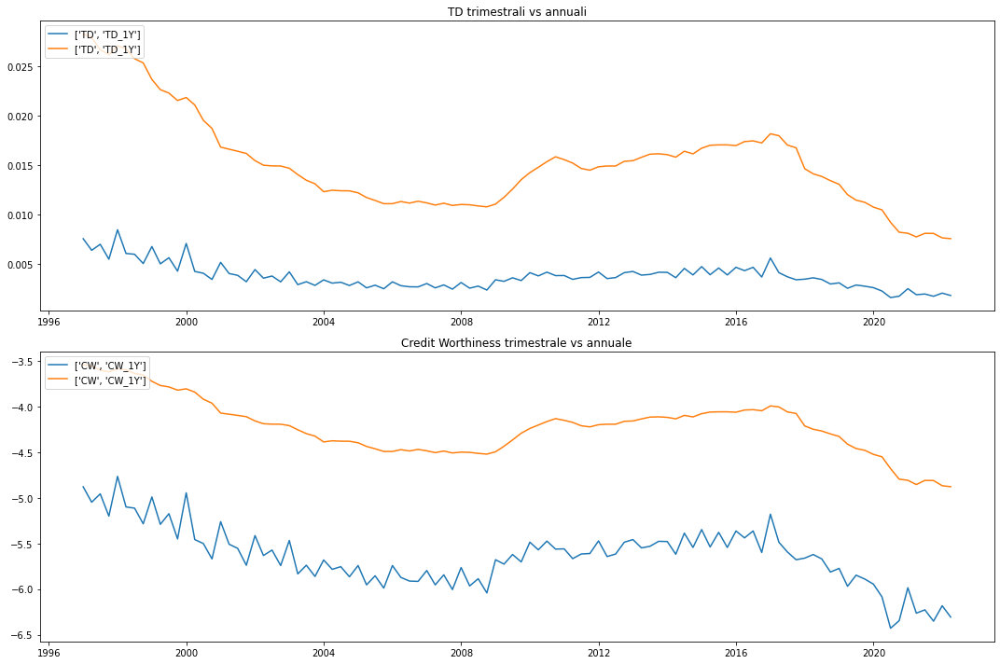

In [8]:
fig, axs = plt.subplots(2,1,figsize=(15, 10))

axs[0].plot(DF_CW_ALL[['TD','TD_1Y']], label = ['TD', 'TD_1Y'])
axs[0].set_title('TD trimestrali vs annuali')
axs[0].legend(loc='upper left')

axs[1].plot(DF_CW_ALL[['CW','CW_1Y']], label = ['CW', 'CW_1Y'])
axs[1].set_title('Credit Worthiness trimestrale vs annuale')
axs[1].legend(loc='upper left')

fig.tight_layout()

In [9]:
DF_YoY = pd.read_excel(path, 'DF_YoY', index_col=[0], parse_dates=[0])
DF_DECO = pd.read_excel(path, 'T_Deco_Var', index_col=[1])
DF_DECO

,ID,Descrizione
Variable,,
X_1,1,Retail Sales (Real/Volume)
X_2,2,Harmonised Index of Consumer Prices
X_3,3,Producer Prices (Output Prices)
X_4,4,Disposable Personal Income Real
X_5,5,Eurostat Industrial Production Italy Wages & S...
X_6,6,House Prices SWDA
X_7,7,Property Price - Non-Residential Buildings
X_8,8,Property Price - Offices
X_9,9,Property Price - Residential Buildings


In [10]:
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#DF_YoY_STD = scaler.fit_transform(DF_YoY)
DF_CW_STD = (DF_CW - DF_CW.mean())/DF_CW.std()
DF_CW_1Y_STD = (DF_CW_1Y - DF_CW_1Y.mean())/DF_CW_1Y.std()

DF_YoY_LAG = CLS_Util.do_lag(DF_YoY)
DF_YoY_STD = (DF_YoY - DF_YoY.mean())/DF_YoY.std()
DF_YoY_STD_LAG = CLS_Util.do_lag(DF_YoY_STD)


pd.DataFrame(DF_YoY_STD).describe()

,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,X_16,X_17,X_18,X_19,X_20,X_21,X_22,X_23,X_24,X_25,X_26,X_27,X_28,X_29,X_30,X_31,X_32,X_33,X_34,X_35,X_36,X_37,X_38,X_39,X_40,X_41,X_42,X_43,X_44
count,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000,77.000
mean,-0.000,-0.000,0.000,-0.000,-0.000,-0.000,0.000,-0.000,-0.000,0.000,0.000,-0.000,0.000,0.000,-0.000,0.000,0.000,-0.000,-0.000,0.000,-0.000,0.000,0.000,0.000,0.000,-0.000,0.000,-0.000,-0.000,0.000,0.000,-0.000,-0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,-0.000,-0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-4.525,-2.064,-1.917,-2.785,-4.466,-1.171,-1.203,-1.271,-1.195,-1.584,-1.192,-2.775,-2.529,-3.096,-2.234,-1.515,-2.108,-0.703,-2.103,-1.987,-1.792,-1.106,-0.985,-2.396,-3.457,-4.104,-3.911,-4.116,-3.634,-3.392,-3.484,-1.356,-4.878,-1.854,-1.932,-1.936,-3.677,-3.217,-3.381,-2.821,-1.510,-2.674,-4.525,-1.841
25%,-0.480,-0.859,-0.776,-0.456,-0.146,-0.614,-0.760,-0.727,-0.573,-0.723,-0.680,-0.655,-0.580,-0.408,-0.579,-0.786,-0.770,-0.373,-0.682,-0.628,-0.698,-0.746,-0.725,-0.652,-0.227,-0.122,-0.326,-0.256,-0.301,-0.256,-0.238,-0.803,-0.067,-0.607,-0.759,-0.982,-0.680,-0.690,-0.215,-0.405,-0.292,-0.451,-0.480,-0.759
50%,-0.023,-0.125,0.094,0.219,0.101,-0.255,-0.438,-0.471,-0.235,-0.298,-0.371,0.084,-0.046,0.015,-0.049,-0.074,0.062,-0.225,-0.089,0.110,-0.277,-0.393,-0.503,-0.241,0.005,0.198,0.026,0.155,-0.128,0.115,0.057,0.103,0.195,-0.153,0.101,-0.028,0.007,-0.123,0.077,-0.044,-0.069,0.193,-0.022,-0.123
75%,0.365,0.693,0.441,0.608,0.362,-0.085,0.951,0.679,-0.058,0.744,0.507,0.620,0.603,0.593,0.460,0.514,0.601,-0.030,0.481,0.532,0.812,0.721,1.092,0.580,0.393,0.377,0.391,0.249,0.435,0.404,0.313,0.505,0.389,0.754,0.433,0.807,0.569,0.547,0.428,0.483,0.132,0.612,0.365,0.704
max,5.196,2.013,5.150,3.165,4.600,3.074,2.375,2.606,3.067,3.054,3.482,2.580,3.209,1.997,3.087,3.381,2.039,4.470,3.423,3.289,1.982,2.747,2.311,2.632,3.518,1.674,1.614,1.621,1.863,1.827,2.044,3.549,4.605,2.568,5.144,1.880,2.692,2.661,4.668,3.817,8.242,2.683,5.198,2.136


In [11]:
ADF_YoY = CLS_Util.GM_ADF_ALL(DF_YoY)
ADF_YoY_STD = CLS_Util.GM_ADF_ALL(DF_YoY_STD)
ADF_CW = CLS_Util.GM_ADF_ALL(DF_CW)
ADF_CW_1Y = CLS_Util.GM_ADF_ALL(DF_CW_1Y)
ADF_CW_STD = CLS_Util.GM_ADF_ALL(DF_CW_STD)
ADF_CW_1Y_STD = CLS_Util.GM_ADF_ALL(DF_CW_1Y_STD)
with pd.ExcelWriter('00_Regression_Analysis_Input_data.xlsx') as writer:
 DF_CW.to_excel(writer, sheet_name='DF_CW')   
 DF_CW_STD.to_excel(writer, sheet_name='DF_CW_STD') 
    
 DF_CW_1Y.to_excel(writer, sheet_name='DF_CW_1Y')   
 DF_CW_1Y_STD.to_excel(writer, sheet_name='DF_CW_1Y_STD') 
    
 DF_YoY.to_excel(writer, sheet_name='DF_YoY')
 DF_YoY_LAG.to_excel(writer, sheet_name='DF_YoY_LAG')

 DF_YoY_STD.to_excel(writer, sheet_name='DF_YoY_STD')    
 DF_YoY_STD_LAG.to_excel(writer, sheet_name='DF_YoY_STD_LAG')   
 
 ADF_YoY.to_excel(writer, sheet_name='ADF_YoY')
 ADF_YoY_STD.to_excel(writer, sheet_name='ADF_YoY_STD')   
 ADF_CW.to_excel(writer, sheet_name='ADF_CW')   
 ADF_CW_STD.to_excel(writer, sheet_name='ADF_CW_STD') 
 ADF_CW_1Y.to_excel(writer, sheet_name='ADF_CW_1Y')   
 ADF_CW_1Y_STD.to_excel(writer, sheet_name='ADF_CW_1Y_STD')  
 
 DF_DECO.to_excel(writer, sheet_name='DF_DECO')  
 

#  CredithWortiness Univariate OLS Regression

In [12]:
#we get the total Dataframe containing the variable to Explain and all the possible explicative variables
df_all = pd.concat([DF_CW_1Y, DF_YoY_LAG], axis= 1, join='inner')
df_all_STD= pd.concat([DF_CW_1Y_STD, DF_YoY_STD_LAG], axis= 1, join='inner')


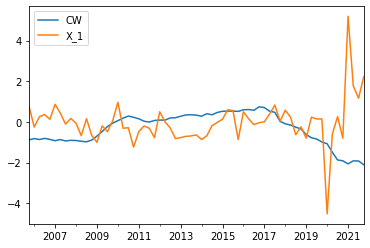

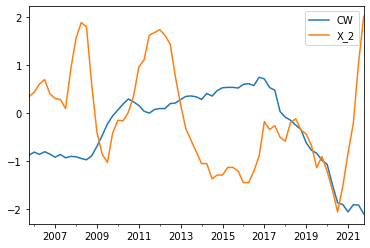

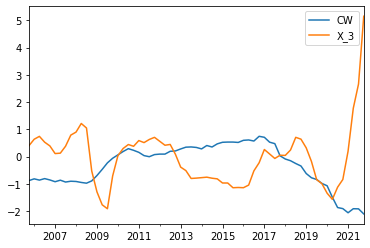

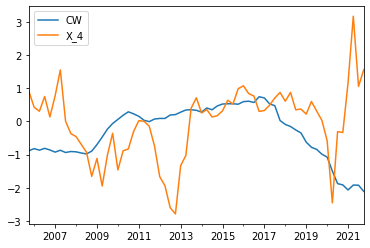

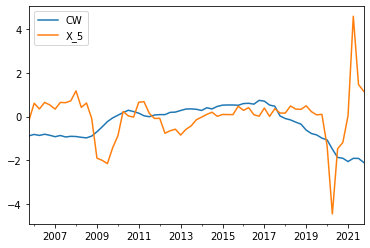

...

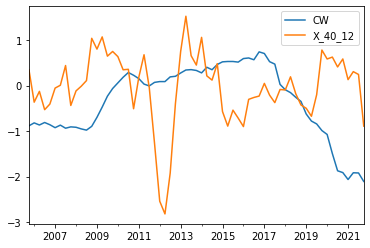

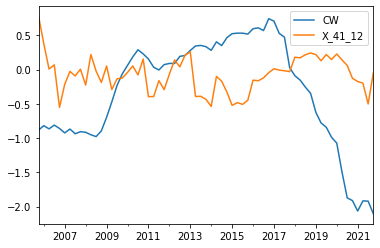

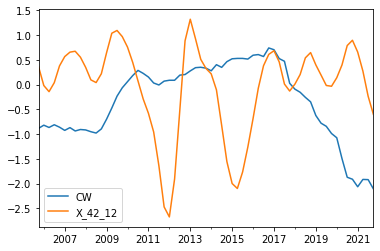

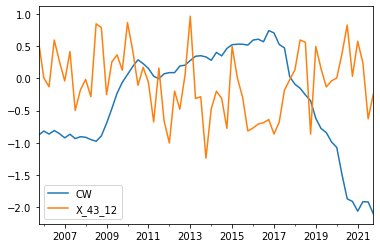

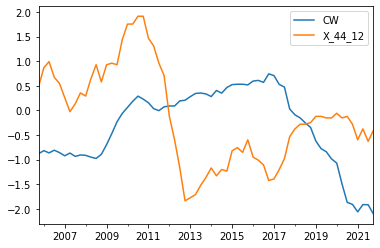

In [13]:
CLS_Util.Delete_Charts()
CLS_Util.ALL_CHARTS_TOT(df_all_STD, 'ALL_CHARTS_YoY_STD.XLSX')
CLS_Util.Delete_Charts()

In [14]:
Unireg_all(df_all_STD, 'CW Reg YoY STD')

,Data,Variable,R,PVAL,PARAMS
X_32_3,CW Reg YoY STD,X_32_3,0.741,0.000,-0.628
X_32_2,CW Reg YoY STD,X_32_2,0.733,0.000,-0.625
X_32_4,CW Reg YoY STD,X_32_4,0.673,0.000,-0.639
X_32_1,CW Reg YoY STD,X_32_1,0.664,0.000,-0.595
X_17_9,CW Reg YoY STD,X_17_9,0.618,0.000,0.645
...,...,...,...,...,...
X_25_8,CW Reg YoY STD,X_25_8,0.000,0.971,-0.004
X_30_9,CW Reg YoY STD,X_30_9,0.000,0.992,0.001
X_37_8,CW Reg YoY STD,X_37_8,0.000,0.994,-0.001
X_31_10,CW Reg YoY STD,X_31_10,0.000,0.996,-0.000


In [15]:
Unireg_all(df_all, 'CW Reg YoY')

,Data,Variable,R,PVAL,PARAMS
X_32_3,CW Reg YoY,X_32_3,0.741,0.000,-0.049
X_32_2,CW Reg YoY,X_32_2,0.733,0.000,-0.048
X_32_4,CW Reg YoY,X_32_4,0.673,0.000,-0.049
X_32_1,CW Reg YoY,X_32_1,0.664,0.000,-0.046
X_17_9,CW Reg YoY,X_17_9,0.618,0.000,0.900
...,...,...,...,...,...
X_25_8,CW Reg YoY,X_25_8,0.000,0.971,-0.000
X_30_9,CW Reg YoY,X_30_9,0.000,0.992,0.001
X_37_8,CW Reg YoY,X_37_8,0.000,0.994,-0.000
X_31_10,CW Reg YoY,X_31_10,0.000,0.996,-0.000


In [16]:
# il modello stimato é
# CW = b0 + b1*CreditToGDP_Gap_2 + b2*CreditToGDP_Gap_6+ b3*NPL_3+ b4*EXPORT_3+ e

#df= df_all_STD.loc[:,['CW','X_32_2', 'X_32_6','X_17_3','X_14_3']]
#df.rename(columns={'X_32_2':'CreditToGDP_Gap_2','X_32_6':'CreditToGDP_Gap_6','X_17_3':'NPL_3','X_14_3':'EXPORT_3'}, inplace=True)

df= df_all.loc[:,['CW','X_32_2','X_17_3','X_14_3']]
df.rename(columns={'X_32_2':'CreditToGDP_Gap_2',
                   'X_17_3':'NPL_3','X_14_3':'EXPORT_3'}, inplace=True)

YVAR = df.loc[:,'CW']
XVAR = df.loc[:,['CreditToGDP_Gap_2', 'NPL_3','EXPORT_3']]

CONST = pd.DataFrame(index=df.index) 
CONST['CONST']= 1
XVAR_TOT = pd.concat([CONST,XVAR], axis=1, join='inner')
model = sm.OLS(YVAR, XVAR_TOT)
results = model.fit()

In [17]:
#le variabili esplicative risultano significative e con segno coerente con l'aspettattiva teorica:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     CW   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     137.0
Date:                Thu, 13 Oct 2022   Prob (F-statistic):           4.62e-27
Time:                        08:57:46   Log-Likelihood:                 67.469
No. Observations:                  65   AIC:                            -126.9
Df Residuals:                      61   BIC:                            -118.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
CONST                -4.3349      0.012   -367.911      0.000      -4.358      -4.311
CreditToGDP_Gap_2    -0.0470      0.004    -13.115      0.000      -0.054      -0.040
NPL_3                 0.2334      0.063      3.693      0.000       0.107       0.360
EXPORT_3             -0.8923      0.129     -6.893      0.000      -1.151      -0.633
==============================================================================
Omnibus:                        1.020   Durbin-Watson:                   0.784
Prob(Omnibus):                  0.600   Jarque-Bera (JB):                0.427
Skew:                          -0.079   Prob(JB):                        0.808
Kurtosis:                       3.365   Cond. No.                         51.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Matrice di correlazione e Condition Number

In [20]:
CORR_MAT = XVAR.corr()
CORR_MAT

,CreditToGDP_Gap_2,NPL_3,EXPORT_3
CreditToGDP_Gap_2,1.000,-0.644,-0.349
NPL_3,-0.644,1.000,0.174
EXPORT_3,-0.349,0.174,1.000


In [19]:
result =  np.linalg.cond(CORR_MAT)
result

5.515205789156765

# Previsti vs Effettivi

In [21]:
CW_Predicted = results.predict(XVAR_TOT)
DF_CW_Predicted = pd.DataFrame(CW_Predicted,index=XVAR_TOT.index)
DF_CW_Predicted.columns = ['CW_Predicted']

DF_CW_Compare = pd.concat([DF_CW_Predicted,YVAR, DF_CW_1Y['TD']],axis=1, join= 'inner')
DF_CW_Compare['TD_Predicted']=DF_CW_Compare['CW_Predicted'].map(lambda x: 1/(1+math.exp(-x)))


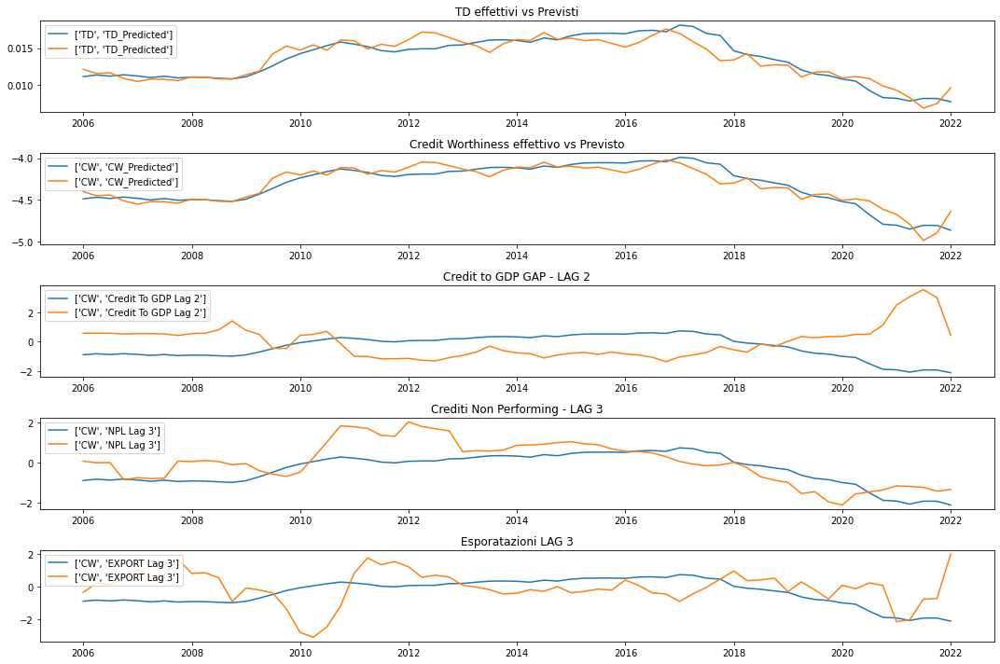

In [22]:
fig, axs = plt.subplots(5,1,figsize=(15, 10))

axs[0].plot(DF_CW_Compare[['TD','TD_Predicted']], label = ['TD', 'TD_Predicted'])
axs[0].set_title('TD effettivi vs Previsti')
axs[0].legend(loc='upper left')

axs[1].plot(DF_CW_Compare[['CW','CW_Predicted']], label = ['CW', 'CW_Predicted'])
axs[1].set_title('Credit Worthiness effettivo vs Previsto')
axs[1].legend(loc='upper left')

axs[2].plot(df_all_STD[['CW','X_32_2']], label = ['CW', 'Credit To GDP Lag 2'])
axs[2].set_title("Credit to GDP GAP - LAG 2")
axs[2].legend(loc='upper left')

axs[3].plot(df_all_STD[['CW','X_17_3']], label = ['CW', 'NPL Lag 3'])
axs[3].set_title("Crediti Non Performing - LAG 3")
axs[3].legend(loc='upper left')

axs[4].plot(df_all_STD[['CW','X_14_3']], label = ['CW', 'EXPORT Lag 3'])
axs[4].set_title("Esporatazioni LAG 3")
axs[4].legend(loc='upper left')

fig.tight_layout()

# Test 

In [ ]:
def Test_evaluation_metrics_func(y_true, y_pred):
    from sklearn import metrics
    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    def sqrt_mean_squared_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    Forecast_Performance={}
    #Lista di tuple con descrizione e funzione di misurazione delle performance
    Performance_Functions = [('MSE:Mean Square Error', metrics.mean_squared_error), 
                             ('MAE:Mean Absolute Error', metrics.mean_absolute_error),
                             ('RMSE:Mean Square Error',sqrt_mean_squared_error),
                            ('MAPE:Mean Square Error', mean_absolute_percentage_error),
                             ('R2: R2 score',metrics.r2_score)]
    print('Evaluation metric results:-')
    for pair in Performance_Functions:
      value =  pair[1](y_true, y_pred) 
      Forecast_Performance[pair[0]]=value  
      print("{} : {:,.2f}".format( pair[0], value))

    print(end='\n\n')
    
    result = pd.DataFrame(Forecast_Performance,index=[0])
    #result.columns=[['MSE', 'MAE', 'RMSE', 'MAPE', 'R2']]
    return result

In [ ]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression(fit_intercept=True)

In [ ]:
NTEST = 10
Train, Test = df.iloc[0:-NTEST],df.iloc[-NTEST:]
X_train,X_test,Y_train, Y_test = Train.iloc[:,1:],Test.iloc[:,1:],Train.iloc[:,0],Test.iloc[:,0],


In [ ]:
lm.fit(X_train, Y_train) 
DF_CW_Predicted = pd.DataFrame(lm.predict(X_test),index=X_test.index)
DF_CW_Predicted.columns = ['CW_Predicted']
DF_CW_Predicted.describe()

,CW_Predicted
count,10.000
mean,-4.615
std,0.215
min,-4.989
25%,-4.766
50%,-4.570
75%,-4.435
max,-4.359


<AxesSubplot:>

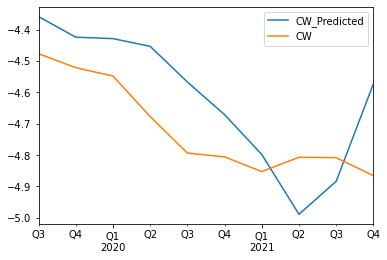

In [ ]:
df_test_compare = pd.concat([DF_CW_Predicted,Y_test],axis=1, join= 'inner')
df_test_compare.plot()

In [ ]:
Test_evaluation_metrics_func(Y_test.values, DF_CW_Predicted.values)

Evaluation metric results:-
MSE:Mean Square Error : 0.03
MAE:Mean Absolute Error : 0.15
RMSE:Mean Square Error : 0.17
MAPE:Mean Square Error : 4.74
R2: R2 score : -0.45




,MSE:Mean Square Error,MAE:Mean Absolute Error,RMSE:Mean Square Error,MAPE:Mean Square Error,R2: R2 score
0,0.028,0.152,0.169,4.745,-0.446
